# 17 Image generation | Diffusion with baseline & metrics

In [1]:
import os
import sys
import pathlib
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

os.environ["KERAS_BACKEND"] = "jax"

import keras

from IPython.display import clear_output
from IPython.core.magic import register_cell_magic

@register_cell_magic
def backend(line, cell):
    current, required = os.environ.get("KERAS_BACKEND", ""), line.split()[-1]
    if current == required:
        get_ipython().run_cell(cell)
    else:
        print(
            f"This cell requires the {required} backend. To run it, change KERAS_BACKEND to "
            f"\"{required}\" at the top of the notebook, restart the runtime, and rerun the notebook."
        )

In [2]:
def plot_history(history, metric):
    accuracy = history.history[metric]
    val_accuracy = history.history[f"val_{metric}"]
    epochs = range(1, len(accuracy) + 1)

    plt.plot(epochs, accuracy, "r--", label=f"Training {metric}")
    plt.plot(epochs, val_accuracy, "b", label=f"Validation {metric}")
    plt.title(f"Training and validation {metric}")
    plt.legend()
    plt.show()

In [3]:
IMGGEN_DIR = pathlib.Path("image-generation")
IMGGEN_DIR.mkdir(exist_ok=True)

DATASET_DIR = pathlib.Path(IMGGEN_DIR / "datasets")
DATASET_DIR.mkdir(exist_ok=True)

MODELS_DIR = pathlib.Path("models")
MODELS_DIR.mkdir(exist_ok=True)

---

## Diffusion models

### The Oxford Flowers dataset

In [4]:
fpath = keras.utils.get_file(
    origin="https://www.robots.ox.ac.uk/~vgg/data/flowers/102/102flowers.tgz",
    cache_dir=IMGGEN_DIR,
    cache_subdir=DATASET_DIR.name,
    extract=True,
)

BATCH_SIZE = 32
IMAGE_SIZE = 128
IMAGES_DIR = os.path.join(fpath, "jpg")

dataset = keras.utils.image_dataset_from_directory(
    IMAGES_DIR,
    # We won't need the labels, just the images.
    labels=None,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    # Crops images when resizing them to preserve their aspect ratio
    crop_to_aspect_ratio=True,
)

dataset = dataset.rebatch(BATCH_SIZE, drop_remainder=True)
TOTAL_BATCHES = dataset.reduce(0, lambda count, _: count + 1).numpy().item()
dataset = dataset.shuffle(buffer_size=TOTAL_BATCHES, reshuffle_each_iteration=False)
# https://claude.ai/share/c351de67-2659-489d-9020-7f52dfd6f329
VAL_BATCHES = max(1, TOTAL_BATCHES // 10)
TRAIN_BATCHES = TOTAL_BATCHES - VAL_BATCHES
val_ds = dataset.take(VAL_BATCHES).shuffle(buffer_size=VAL_BATCHES)
train_ds = dataset.skip(VAL_BATCHES).shuffle(buffer_size=TRAIN_BATCHES)
print(f"{TOTAL_BATCHES} batches.")

344862509/344862509 ━━━━━━━━━━━━━━━━━━━━ 20s 0us/step
Found 8189 files.
255 batches.


### A U-Net denoising autoencoder

In [6]:
# Utility function to apply a block of layers with a residual connection
def residual_block(x, width):
    input_width = x.shape[3]
    if input_width == width:
        residual = x
    else:
        residual = keras.layers.Conv2D(width, 1)(x)
    x = keras.layers.BatchNormalization(center=False, scale=False)(x)
    x = keras.layers.Conv2D(width, 3, padding="same", activation="swish")(x)
    x = keras.layers.Conv2D(width, 3, padding="same")(x)
    x = x + residual
    return x

def get_model(image_size, widths, block_depth):
    noisy_images = keras.Input(shape=(image_size, image_size, 3))
    noise_rates = keras.Input(shape=(1, 1, 1))

    x = keras.layers.Conv2D(widths[0], 1)(noisy_images)
    n = keras.layers.UpSampling2D(image_size, interpolation="nearest")(noise_rates)
    x = keras.layers.Concatenate()([x, n])

    skips = []
    # Dowsampling stage
    for width in widths[:-1]:
        for _ in range(block_depth):
            x = residual_block(x, width)
            # Save the intermediate outputs for the Upsampling stage
            skips.append(x)
        x = keras.layers.AveragePooling2D(pool_size=2)(x)

    # Middle stage
    for _ in range(block_depth):
        x = residual_block(x, widths[-1])

    # Upsampling stage
    for width in reversed(widths[:-1]):
        x = keras.layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            # Reuse the intermediate Downsampling outputs
            x = keras.layers.Concatenate()([x, skips.pop()])
            x = residual_block(x, width)

    # We set the kernel initializer for the last layer to "zeros,"
    # making the model predict only zeros after initialization (that
    # is, our default assumption before training is "no noise").
    pred_noise_masks = keras.layers.Conv2D(3, 1, kernel_initializer="zeros")(x)

    # Creates the functional model
    return keras.Model([noisy_images, noise_rates], pred_noise_masks)

### The concepts of diffusion time and diffusion schedule

In [7]:
def diffusion_schedule(
    diffusion_times,
    min_signal_rate=0.02,
    max_signal_rate=0.95,
):
    start_angle = keras.ops.cast(keras.ops.arccos(max_signal_rate), "float32")
    end_angle = keras.ops.cast(keras.ops.arccos(min_signal_rate), "float32")
    diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)
    signal_rates = keras.ops.cos(diffusion_angles)
    noise_rates = keras.ops.sin(diffusion_angles)
    return noise_rates, signal_rates

### The Diffusion Model

In [8]:
@keras.saving.register_keras_serializable()
class DiffusionModel(keras.Model):
    def __init__(self, image_size, widths, block_depth, **kwargs):
        super().__init__(**kwargs)
        self.image_size = image_size
        self.widths = widths
        self.block_depth = block_depth

        self.denoising_model = get_model(image_size, widths, block_depth)
        self.seed_generator = keras.random.SeedGenerator()

        # Our loss function
        self.loss = keras.losses.MeanAbsoluteError()

        # We'll use this to normalize input images.
        self.normalizer = keras.layers.Normalization()

        # KID metric for evaluating generation quality
        self.kid = KID(name="kid", image_size=image_size)

    def denoise(self, noisy_images, noise_rates, signal_rates):
        # The denoising model predicts the noise to be removed
        pred_noise_masks = self.denoising_model([noisy_images, noise_rates])
        # Reconstructs the predicted clean image (weighted sum with a bit less noise)
        pred_images = (
            noisy_images - noise_rates * pred_noise_masks
        ) / signal_rates
        return pred_images, pred_noise_masks

    def call(self, images):
        images = self.normalizer(images, training=True)
        # Samples random noise masks
        noise_masks = keras.random.normal(
            (BATCH_SIZE, self.image_size, self.image_size, 3),
            seed=self.seed_generator,
        )
        # Samples random diffusion times (between zero and one)
        diffusion_times = keras.random.uniform(
            (BATCH_SIZE, 1, 1, 1),
            minval=0.0,
            maxval=1.0,
            seed=self.seed_generator,
        )
        noise_rates, signal_rates = diffusion_schedule(diffusion_times)
        # Create noisy images by mixing noise and image (like a weighted sum)
        noisy_images = signal_rates * images + noise_rates * noise_masks
        # Denoises them
        pred_images, pred_noise_masks = self.denoise(
            noisy_images, noise_rates, signal_rates
        )
        return pred_images, pred_noise_masks, noise_masks

    def compute_loss(self, x, y, y_pred, sample_weight=None, training=True):
        _, pred_noise_masks, noise_masks = y_pred
        return self.loss(noise_masks, pred_noise_masks)

    def generate(self, num_images, diffusion_steps):
        # Starts from Gaussian noise
        noisy_images = keras.random.normal(
            (num_images, self.image_size, self.image_size, 3),
            seed=self.seed_generator,
        )
        step_size = 1.0 / diffusion_steps
        for step in range(diffusion_steps):
            # Determine which timestep we're at
            diffusion_times = keras.ops.ones((num_images, 1, 1, 1)) - step * step_size
            # Computes appropriate noise and signal rates
            noise_rates, signal_rates = diffusion_schedule(diffusion_times)
            # Calls denoising model
            pred_images, pred_noises = self.denoise(
                noisy_images, noise_rates, signal_rates
            )
            # Computes noise and signal rates for the next timestep
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = diffusion_schedule(
                next_diffusion_times
            )
            # Update the image by mixing image and noise (gradually we remove the noise)
            noisy_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
        # Denormalizes images so their values fit between 0 and 255
        images = (
            self.normalizer.mean + pred_images * self.normalizer.variance**0.5
        )
        return keras.ops.clip(images, 0.0, 255.0)

    # plumbing: making this model serializable/reloadable ----------------------
    # https://chatgpt.com/share/69bd2782-4a00-8005-a7d9-e9e0e052dd88
    def build(self, input_shape):
        super().build(input_shape)

    def get_config(self):
        config = super().get_config()
        config.update({
            "image_size": self.image_size,
            "widths": self.widths,
            "block_depth": self.block_depth,
        })
        return config

    @classmethod
    def from_config(cls, config):
        return cls(**config)

### Metric: Kernel Inception Distance

Metrics have been proposed to try and measure the quality of images in a way that corresponds to human perception (only measuring pixel distance fails to do so). For that, an important step was the [**Fréchet Inception Distance**](https://arxiv.org/abs/1706.08500), that passes both the real and generated images through an pre-trained image classifier (the [Inception Net](https://arxiv.org/abs/1409.4842), in this case, hence the name), and compares the distribution of **features** inside the net. The metric thus compares the true and generated image from the 'point of view' of a well-trained generalist model. For an implementation, [this](https://github.com/jleinonen/keras-fid) might be worth looking into.

The [**Kernel Inception Distance**](https://arxiv.org/abs/1801.01401) follows a similar principle (comparing features produced by a Inception Net for real and generated images), but using a different mathematical formulation with several advantages (one of which is compute speed!). It is the one we will be using here (implementation adapted from [here](https://keras.io/examples/generative/ddim/#kernel-inception-distance)).

Note that for speed, the method `KIDCallback.run_kid` only runs on **one batch**! That means a much higher variance, that you can see in the plot below. With more time, one could remove the `break`, run for a fractions of the validation dataset, or even the whole thing. Another option (see the Claude link) would be to compute the KID/val-KID as an EMA, storing them in the class, and updating them at each step.

In [9]:
# see: https://claude.ai/share/ab7902ac-9a9a-4113-bb7b-9060ae14b681
#      https://claude.ai/share/60713993-51e0-4541-b8ea-c39fe78a58db
#      https://claude.ai/share/d3f0e637-52b2-416e-8976-c61c6e0a698c

KID_DIFFUSION_STEPS = 5

@keras.saving.register_keras_serializable()
class KID(keras.metrics.Metric):
    def __init__(self, name, image_size, kid_image_size = 75, **kwargs):
        super().__init__(name=name, **kwargs)

        # KID is estimated per batch and is averaged across batches
        self.kid_tracker = keras.metrics.Mean(name="kid_tracker")

        # a pretrained InceptionV3 is used without its classification layer
        # transform the pixel values to the 0-255 range, then use the same
        # preprocessing as during pretraining
        self.encoder = keras.Sequential(
            [
                keras.Input(shape=(image_size, image_size, 3)),
                keras.layers.Rescaling(255.0),
                keras.layers.Resizing(height=kid_image_size, width=kid_image_size),
                keras.layers.Lambda(keras.applications.inception_v3.preprocess_input),
                keras.applications.InceptionV3(
                    include_top=False,
                    input_shape=(kid_image_size, kid_image_size, 3),
                    weights="imagenet",
                ),
                keras.layers.GlobalAveragePooling2D(),
            ],
            name="inception_encoder",
        )

    def polynomial_kernel(self, features_1, features_2):
        feature_dimensions = keras.ops.cast(keras.ops.shape(features_1)[1], dtype="float32")
        return (
            features_1 @ keras.ops.transpose(features_2) / feature_dimensions + 1.0
        ) ** 3.0

    def update_state(self, real_images, generated_images, sample_weight=None):
        real_features = self.encoder(real_images, training=False)
        generated_features = self.encoder(generated_images, training=False)

        # compute polynomial kernels using the two sets of features
        kernel_real = self.polynomial_kernel(real_features, real_features)
        kernel_generated = self.polynomial_kernel(
            generated_features, generated_features
        )
        kernel_cross = self.polynomial_kernel(real_features, generated_features)

        # estimate the squared maximum mean discrepancy using the average kernel values
        batch_size = real_features.shape[0]
        batch_size_f = keras.ops.cast(batch_size, dtype="float32")
        mean_kernel_real = keras.ops.sum(kernel_real * (1.0 - keras.ops.eye(batch_size))) / (
            batch_size_f * (batch_size_f - 1.0)
        )
        mean_kernel_generated = keras.ops.sum(
            kernel_generated * (1.0 - keras.ops.eye(batch_size))
        ) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_cross = keras.ops.mean(kernel_cross)
        kid = mean_kernel_real + mean_kernel_generated - 2.0 * mean_kernel_cross

        # update the average KID estimate
        self.kid_tracker.update_state(kid)

    def result(self):
        return self.kid_tracker.result()

    def reset_state(self):
        self.kid_tracker.reset_state()

# note: one could update this class to use an EMA
# see: https://chatgpt.com/share/69c4060e-c2ec-832c-83b2-d0d923390a52
class KIDCallback(keras.callbacks.Callback):
    def run_kid(self, ds, logs, mode=None):
        self.model.kid.reset_state()
        for images in ds:
            images_norm = self.model.normalizer(images, training=False)
            generated = self.model.generate(
                num_images=images.shape[0],
                diffusion_steps=KID_DIFFUSION_STEPS,
            )
            # Renormalize generated images back before KID
            generated_norm = (
                generated - self.model.normalizer.mean
            ) / self.model.normalizer.variance**0.5
            self.model.kid.update_state(images_norm, generated_norm)
            # only one (random) batch!
            break
        logs[f"{mode}kid"] = float(self.model.kid.result())
    def on_epoch_end(self, epoch, logs=None):
        # one batch for train, one for val (high variance, but much faster)
        self.run_kid(train_ds, logs, "")
        self.run_kid(val_ds, logs, "val_")

### Instantiate Model

In [10]:
DIFF_NAME = "diffusion-oxford-flowers.keras"

model = DiffusionModel(IMAGE_SIZE, widths=[32, 64, 96, 128], block_depth=2)
# Computes the mean and variance necessary to perform normalization —
# don't forget it!
model.normalizer.adapt(train_ds)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


### Baselines

There are two quantities we measure during training, our `MeanAbsoluteError` (between `noise_masks` and `pred_noise_masks`), and our Kernel Inception Distance (`KID`).

#### Loss (MAE)

For the loss discussion, see [this](https://claude.ai/share/b7945696-2a02-44cb-afaa-c55ff77f9a19).

Our loss computes the discrepancy between the predicted noise and ground-truth noise (computed analytically using our schedule). The dumbest predictor would be to predict only zeros:

In [11]:
loss_tot = 0
for i, images in val_ds.enumerate():
    # fake ground-truth noise
    noise_masks = keras.random.normal(images.shape)
    # dumb predictor
    zeros = keras.ops.zeros_like(noise_masks)
    loss_tot += model.loss(noise_masks, zeros)

print(f"Zero-prediction baseline MAE: {float(loss_tot / VAL_BATCHES):.4f}")

Zero-prediction baseline MAE: 0.7979


Very similar results using the noising logic in our Diffusion model.

In [19]:
loss_tot = 0
steps = 20
step_size = 1 / steps
for i, images in val_ds.enumerate():
    images_norm = model.normalizer(images, training=True)
    # random noise masks
    noise_masks = keras.random.normal(images.shape)

    # 1) random diffusion times (between zero and one)
    diffusion_times = keras.random.uniform(
        (BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0,
    )
    noise_rates, signal_rates = diffusion_schedule(diffusion_times)
    # Create noisy images by mixing noise and image (like a weighted sum)
    noisy_images = signal_rates * images_norm + noise_rates * noise_masks

    # random-noise predictor
    random_pred = keras.ops.zeros(images.shape)
    loss_tot += model.loss(noisy_images, random_pred)

print(f"Random timesteps zero-prediction baseline MAE: {float(loss_tot / VAL_BATCHES):.4f}")

Random timesteps zero-prediction baseline MAE: 0.8067


A slightly more complex dummy predictor would be random noise as well.

In [12]:
loss_tot = 0
for i, images in val_ds.enumerate():
    # fake ground-truth noise
    noise_masks = keras.random.normal(images.shape)
    # random-noise predictor
    random_pred = keras.random.normal(images.shape)
    loss_tot += model.loss(noise_masks, random_pred)

print(f"Random-noise baseline MAE: {float(loss_tot / VAL_BATCHES):.4f}")

Random-noise baseline MAE: 1.1282


Very similar results using the noising logic in our Diffusion model.

In [14]:
loss_tot = 0
steps = 20
step_size = 1 / steps
for i, images in val_ds.enumerate():
    images_norm = model.normalizer(images, training=True)
    # random noise masks
    noise_masks = keras.random.normal(images.shape)

    # random diffusion times (between zero and one)
    diffusion_times = keras.random.uniform(
        (BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0,
    )
    noise_rates, signal_rates = diffusion_schedule(diffusion_times)
    # Create noisy images by mixing noise and image (like a weighted sum)
    noisy_images = signal_rates * images_norm + noise_rates * noise_masks

    # random-noise predictor
    random_pred = keras.random.normal(images.shape)
    loss_tot += model.loss(noisy_images, random_pred)

print(f"Random timesteps random prediction MAE: {float(loss_tot / VAL_BATCHES):.4f}")

Random timesteps baseline MAE: 1.1285


Now, our model has access to `signal_rates`: we can use it to try to reconstruct `noise_masks`, using the same equation but assuming assuming all noise and no signal (thus `signal_rates * images_norm` goes away, and rearrange the equation): this is very accurate close to 0 (almost entirely noise) and not at all when close to 1.

In [16]:
tot_loss = 0

steps = 20
step_size = 1 / steps
for i, images in val_ds.enumerate():
    images_norm = model.normalizer(images, training=True)
    # random noise masks
    noise_masks = keras.random.normal(images.shape)

    # random diffusion times (between zero and one)
    diffusion_times = keras.random.uniform(
        (BATCH_SIZE, 1, 1, 1), minval=0.0, maxval=1.0,
    )
    noise_rates, signal_rates = diffusion_schedule(diffusion_times)
    # Create noisy images by mixing noise and image (like a weighted sum)
    noisy_images = signal_rates * images_norm + noise_rates * noise_masks

    # dummy prediction using `noise_rates`
    dummy_pred = noisy_images / noise_rates
    tot_loss += model.loss(noisy_images, dummy_pred)

print(f"Random timesteps assuming noise MAE: {float(tot_loss / VAL_BATCHES):.4f}")

Random timesteps assuming noise MAE: 0.3754


#### KID

For the KID discussion, see [this](https://chatgpt.com/share/69c413aa-2c68-832d-92eb-62d3090b8860).

What is the KID of comparing true and random images?

In [32]:
model.kid.reset_state()
for i, images in val_ds.enumerate():
    print(f"{i+1} / {VAL_BATCHES}")
    clear_output(wait=True)
    images_norm = model.normalizer(images, training=False)
    # use our normalizer to create 'normalized' noise
    gaussian_noise = keras.random.normal(
        images_norm.shape, #mean = model.normalizer.mean, stddev = model.normalizer.variance ** 0.5
    )
    model.kid.update_state(images_norm, gaussian_noise)
print(f"KID Gaussian noise: {float(model.kid.result()):.4f}")

KID Gaussian noise: 4.1820


Generated images by our untrained model has an even worse KID than random noise!

In [31]:
model.kid.reset_state()
for i, images in val_ds.enumerate():
    print(f"{i+1} / {VAL_BATCHES}")
    clear_output(wait=True)
    images_norm = model.normalizer(images, training=False)
    images_generated = model.generate(
        num_images=images.shape[0],
        diffusion_steps=KID_DIFFUSION_STEPS,
    )
    # Renormalize generated images back before KID
    generated_norm = (
        images_generated - model.normalizer.mean
    ) / model.normalizer.variance**0.5
    model.kid.update_state(images_norm, generated_norm)
print(f"KID untrained model: {float(model.kid.result()):.4f}")

KID untrained model: 5.9652


What is the KID of shuffled images in our dataset (comparing real images, just not the same)? Around zero, so extremely close/good!

In [30]:
model.kid.reset_state()
for i, (images_a, images_b) in enumerate(zip(val_ds, val_ds)):
    print(f"{i+1} / {VAL_BATCHES}")
    clear_output(wait=True)
    images_a_norm = model.normalizer(images_a, training=False)
    images_b_norm = model.normalizer(images_b, training=False)
    model.kid.update_state(images_a_norm, images_b_norm)
print(f"KID shuffled images: {float(model.kid.result()):.4f}")

KID shuffled images: -0.0120


### Training

#### Visualisation Callback

In [153]:
class VisualizationCallback(keras.callbacks.Callback):
    def __init__(self, diffusion_steps=20, num_rows=3, num_cols=6, save_every=10):
        self.diffusion_steps = diffusion_steps
        self.num_rows = num_rows
        self.num_cols = num_cols
        self.save_every = save_every

    def on_epoch_end(self, epoch=None, logs=None):
        if epoch % self.save_every != 0:
            return
        # generate images
        generated_images = self.model.generate(
            num_images=self.num_rows * self.num_cols,
            diffusion_steps=self.diffusion_steps,
        )
        generated_images = keras.ops.convert_to_numpy(generated_images).astype("uint8")
        # plot them
        plt.figure(figsize=(self.num_cols * 2.0, self.num_rows * 2.0))
        for row in range(self.num_rows):
            for col in range(self.num_cols):
                i = row * self.num_cols + col
                plt.subplot(self.num_rows, self.num_cols, i + 1)
                # img = generated_images[i].numpy().astype("uint8")
                img = generated_images[i]
                plt.imshow(img)
                plt.axis("off")
        plt.tight_layout()
        plt.show()
        plt.close()

#### Learning Rate Schedule

In [155]:
# https://keras.io/api/optimizers/learning_rate_schedules/inverse_time_decay/
schedule = keras.optimizers.schedules.InverseTimeDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.1,
)

#### Compilation

In [157]:
model.compile(
    optimizer=keras.optimizers.AdamW(
        # Configures the learning rate decay schedule
        learning_rate=schedule,
        # Turns on Polyak averaging
        use_ema=True,
        # Configures how often to overwrite the model's weights with
        # their exponential moving average
        ema_overwrite_frequency=100,
    ),
)

#### Training

Epoch 1/100
229/230 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - kid: 0.0000e+00 - loss: 0.4123

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:164: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


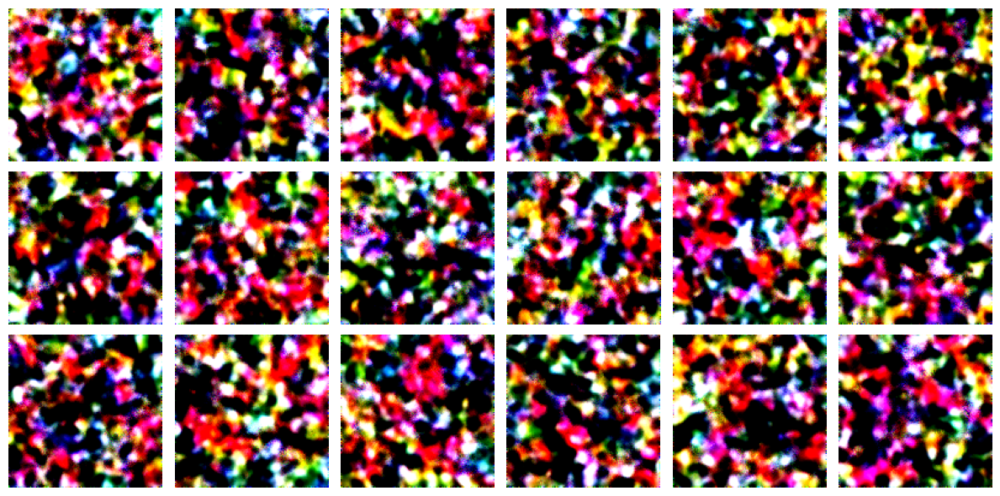

230/230 ━━━━━━━━━━━━━━━━━━━━ 39s 108ms/step - kid: 15.4169 - loss: 0.3193 - val_kid: 16.9642 - val_loss: 0.2176
Epoch 2/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 25s 108ms/step - kid: 2.6731 - loss: 0.1974 - val_kid: 2.3296 - val_loss: 0.1893
Epoch 3/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - kid: 2.1995 - loss: 0.1856 - val_kid: 3.2732 - val_loss: 0.1780
Epoch 4/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - kid: 3.7770 - loss: 0.1739 - val_kid: 2.9419 - val_loss: 0.1723
Epoch 5/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - kid: 1.8880 - loss: 0.1676 - val_kid: 1.5144 - val_loss: 0.1650
Epoch 6/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - kid: 1.3619 - loss: 0.1657 - val_kid: 1.4960 - val_loss: 0.1639
Epoch 7/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - kid: 1.4326 - loss: 0.1626 - val_kid: 1.9674 - val_loss: 0.1610
Epoch 8/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - kid: 4.5841 - loss: 0.1584 - val_kid: 4.9587 - val_loss: 0.1568
Epoch 9/100
230/230 ━━━━━━━━━━━━━━━━━━━━

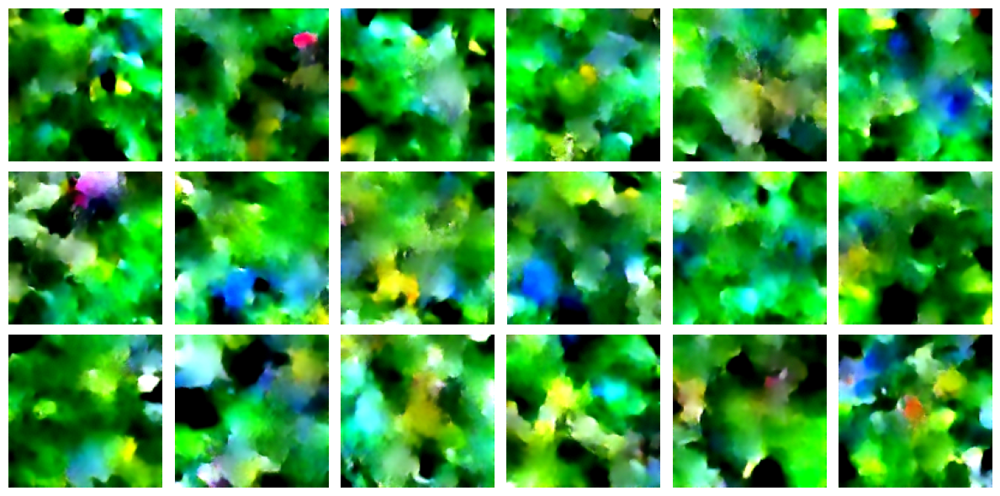

230/230 ━━━━━━━━━━━━━━━━━━━━ 24s 105ms/step - kid: 2.5487 - loss: 0.1542 - val_kid: 1.9755 - val_loss: 0.1509
Epoch 12/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 94ms/step - kid: 3.1379 - loss: 0.1514 - val_kid: 2.5041 - val_loss: 0.1485
Epoch 13/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 0.9860 - loss: 0.1512 - val_kid: 1.0710 - val_loss: 0.1499
Epoch 14/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - kid: 1.7238 - loss: 0.1507 - val_kid: 0.8448 - val_loss: 0.1461
Epoch 15/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - kid: 2.7692 - loss: 0.1491 - val_kid: 2.9103 - val_loss: 0.1488
Epoch 16/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 2.2073 - loss: 0.1489 - val_kid: 3.1428 - val_loss: 0.1464
Epoch 17/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 94ms/step - kid: 0.7673 - loss: 0.1466 - val_kid: 1.1421 - val_loss: 0.1437
Epoch 18/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 2.5535 - loss: 0.1459 - val_kid: 1.3872 - val_loss: 0.1511
Epoch 19/100
230/230 ━━━━━━━━━━━━━━━

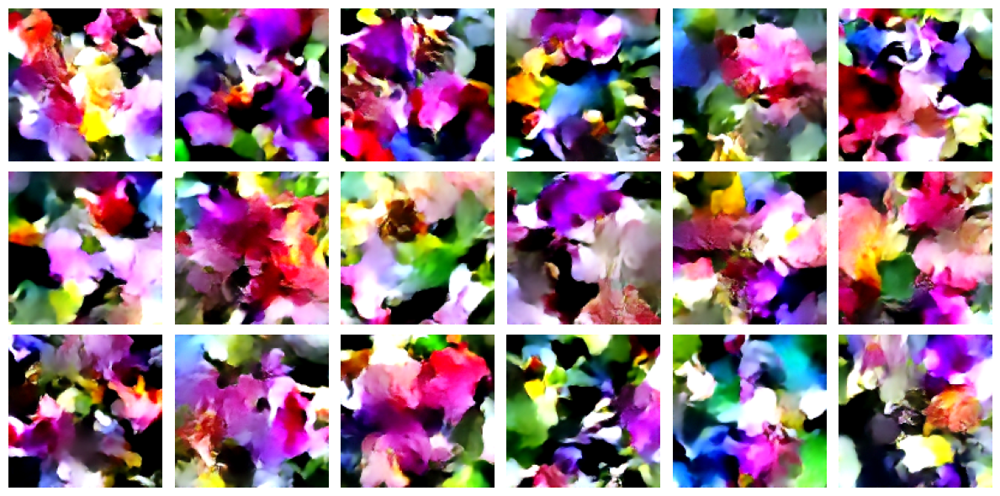

230/230 ━━━━━━━━━━━━━━━━━━━━ 24s 104ms/step - kid: 2.1063 - loss: 0.1449 - val_kid: 1.3753 - val_loss: 0.1402
Epoch 22/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.0870 - loss: 0.1439 - val_kid: 1.5130 - val_loss: 0.1429
Epoch 23/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 2.8125 - loss: 0.1428 - val_kid: 1.0225 - val_loss: 0.1407
Epoch 24/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - kid: 0.0866 - loss: 0.1430 - val_kid: 2.0176 - val_loss: 0.1420
Epoch 25/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - kid: 2.3962 - loss: 0.1427 - val_kid: 1.1550 - val_loss: 0.1373
Epoch 26/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - kid: 1.3686 - loss: 0.1398 - val_kid: 1.2948 - val_loss: 0.1379
Epoch 27/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 2.3361 - loss: 0.1407 - val_kid: 2.9802 - val_loss: 0.1387
Epoch 28/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 95ms/step - kid: 1.0928 - loss: 0.1399 - val_kid: 0.8055 - val_loss: 0.1344
Epoch 29/100
230/230 ━━━━━━━━━━━━━━━

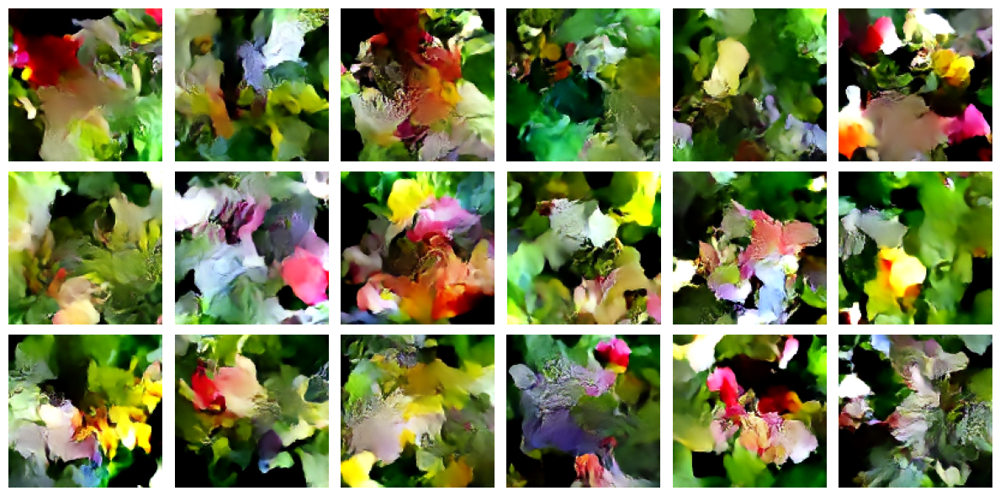

230/230 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - kid: 1.4788 - loss: 0.1376 - val_kid: 1.8736 - val_loss: 0.1376
Epoch 32/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.3185 - loss: 0.1397 - val_kid: 1.0945 - val_loss: 0.1462
Epoch 33/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.0722 - loss: 0.1404 - val_kid: 0.4757 - val_loss: 0.1381
Epoch 34/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.6800 - loss: 0.1377 - val_kid: 1.2756 - val_loss: 0.1364
Epoch 35/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.5015 - loss: 0.1379 - val_kid: 1.1564 - val_loss: 0.1386
Epoch 36/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 3.5639 - loss: 0.1387 - val_kid: 3.8788 - val_loss: 0.1420
Epoch 37/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.9003 - loss: 0.1376 - val_kid: 1.4426 - val_loss: 0.1396
Epoch 38/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 2.7308 - loss: 0.1374 - val_kid: 2.5199 - val_loss: 0.1430
Epoch 39/100
230/230 ━━━━━━━━━━━━━━━━

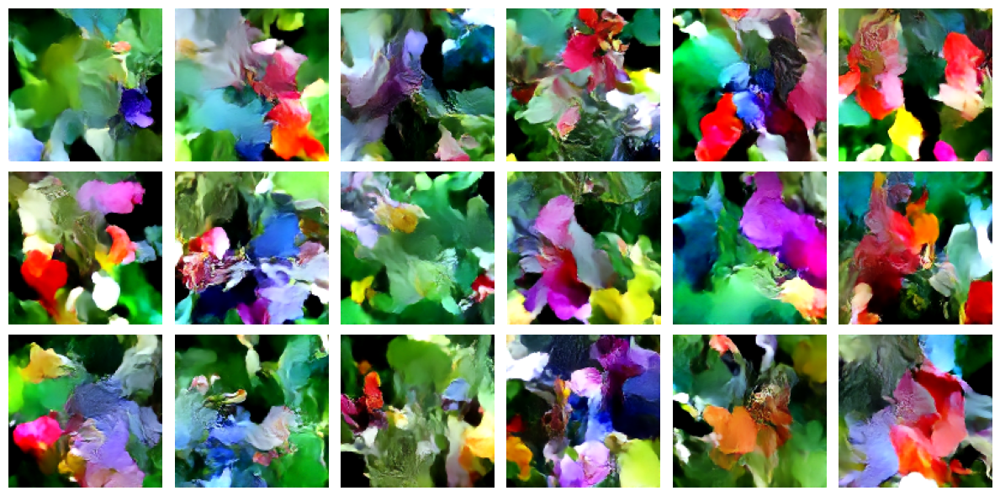

230/230 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - kid: 0.8013 - loss: 0.1374 - val_kid: 0.5095 - val_loss: 0.1372
Epoch 42/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - kid: 2.1582 - loss: 0.1362 - val_kid: 1.1582 - val_loss: 0.1352
Epoch 43/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.3716 - loss: 0.1362 - val_kid: 1.0386 - val_loss: 0.1397
Epoch 44/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 0.5307 - loss: 0.1350 - val_kid: 2.8317 - val_loss: 0.1374
Epoch 45/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.8094 - loss: 0.1371 - val_kid: 1.4086 - val_loss: 0.1358
Epoch 46/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 0.5603 - loss: 0.1366 - val_kid: 0.8326 - val_loss: 0.1346
Epoch 47/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 1.8519 - loss: 0.1344 - val_kid: 1.8825 - val_loss: 0.1353
Epoch 48/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.4381 - loss: 0.1368 - val_kid: 0.6546 - val_loss: 0.1354
Epoch 49/100
230/230 ━━━━━━━━━━━━━━━━

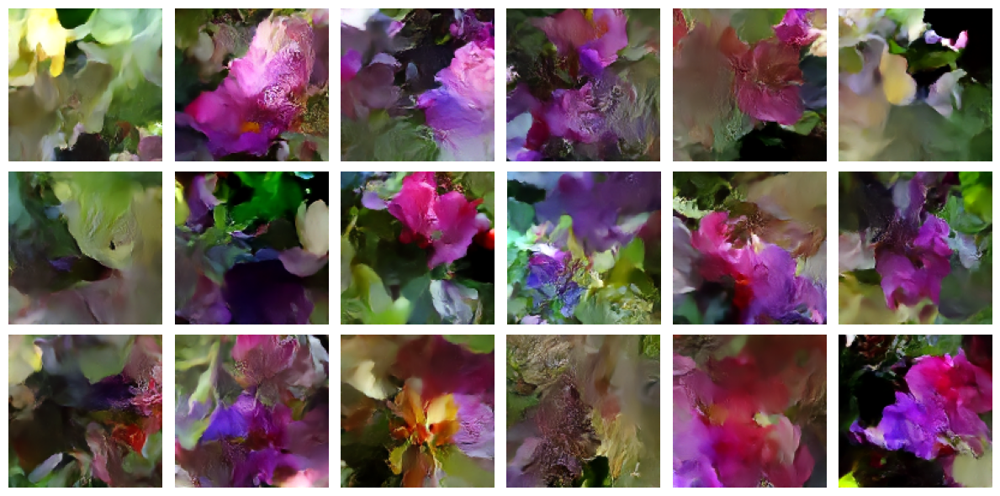

230/230 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - kid: 1.2453 - loss: 0.1349 - val_kid: 1.9874 - val_loss: 0.1363
Epoch 52/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 0.9051 - loss: 0.1350 - val_kid: 2.3839 - val_loss: 0.1342
Epoch 53/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 93ms/step - kid: 3.0674 - loss: 0.1344 - val_kid: 1.7123 - val_loss: 0.1293
Epoch 54/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 3.1287 - loss: 0.1348 - val_kid: 2.5722 - val_loss: 0.1357
Epoch 55/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 0.6781 - loss: 0.1338 - val_kid: 1.4749 - val_loss: 0.1338
Epoch 56/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - kid: 0.8436 - loss: 0.1342 - val_kid: 0.8921 - val_loss: 0.1322
Epoch 57/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 2.5990 - loss: 0.1348 - val_kid: 1.8377 - val_loss: 0.1322
Epoch 58/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 0.9471 - loss: 0.1337 - val_kid: 0.6358 - val_loss: 0.1339
Epoch 59/100
230/230 ━━━━━━━━━━━━━━━━

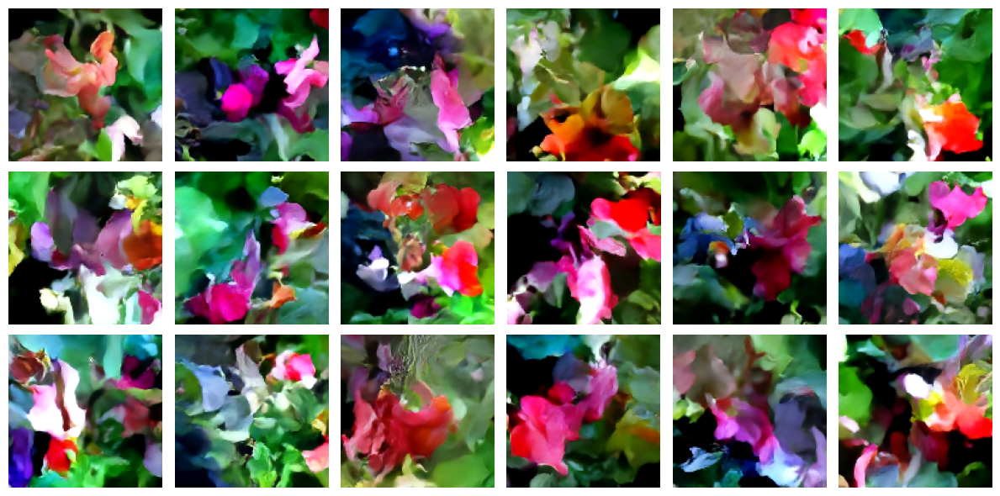

230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 98ms/step - kid: 2.0580 - loss: 0.1330 - val_kid: 1.4914 - val_loss: 0.1355
Epoch 62/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 0.2257 - loss: 0.1335 - val_kid: 1.1499 - val_loss: 0.1345
Epoch 63/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 1.0723 - loss: 0.1332 - val_kid: 1.2707 - val_loss: 0.1311
Epoch 64/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.2250 - loss: 0.1326 - val_kid: 2.3389 - val_loss: 0.1346
Epoch 65/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 1.3128 - loss: 0.1326 - val_kid: 0.6971 - val_loss: 0.1307
Epoch 66/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - kid: 0.5965 - loss: 0.1331 - val_kid: 0.5902 - val_loss: 0.1336
Epoch 67/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.6315 - loss: 0.1326 - val_kid: 1.6256 - val_loss: 0.1321
Epoch 68/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 89ms/step - kid: 1.5289 - loss: 0.1327 - val_kid: 2.3871 - val_loss: 0.1380
Epoch 69/100
230/230 ━━━━━━━━━━━━━━━━

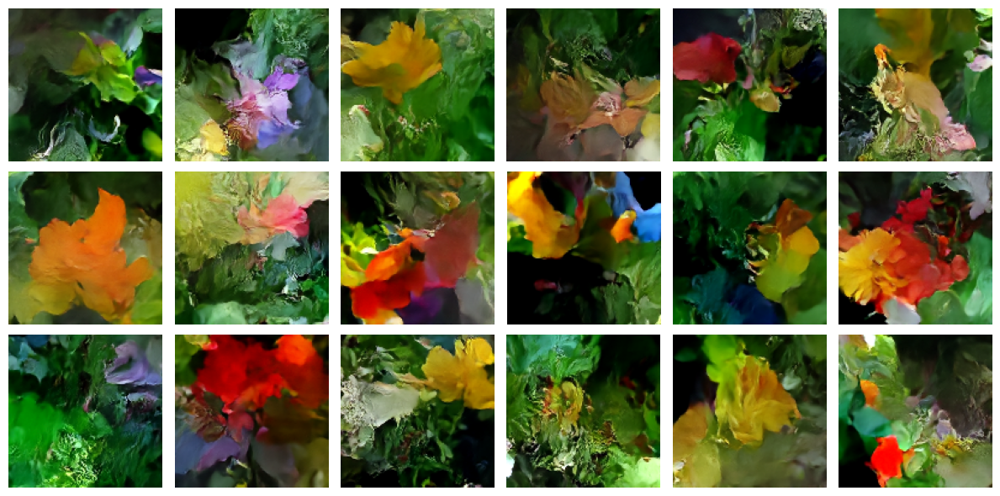

230/230 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - kid: 3.0018 - loss: 0.1333 - val_kid: 2.3356 - val_loss: 0.1314
Epoch 72/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 4.5124 - loss: 0.1344 - val_kid: 2.5361 - val_loss: 0.1342
Epoch 73/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 1.2298 - loss: 0.1326 - val_kid: 2.0782 - val_loss: 0.1298
Epoch 74/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 0.9594 - loss: 0.1335 - val_kid: 1.2534 - val_loss: 0.1356
Epoch 75/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 1.0823 - loss: 0.1332 - val_kid: 0.7021 - val_loss: 0.1310
Epoch 76/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 0.2808 - loss: 0.1323 - val_kid: 0.3775 - val_loss: 0.1317
Epoch 77/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 1.6517 - loss: 0.1328 - val_kid: 1.8496 - val_loss: 0.1304
Epoch 78/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 0.6562 - loss: 0.1318 - val_kid: 0.9649 - val_loss: 0.1307
Epoch 79/100
230/230 ━━━━━━━━━━━━━━━━

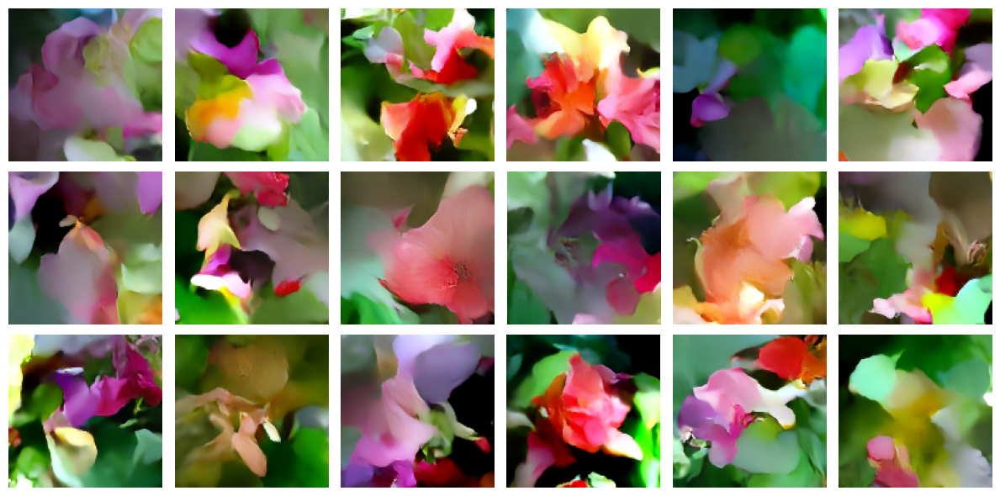

230/230 ━━━━━━━━━━━━━━━━━━━━ 23s 99ms/step - kid: 1.5752 - loss: 0.1324 - val_kid: 3.7701 - val_loss: 0.1291
Epoch 82/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 2.1516 - loss: 0.1329 - val_kid: 1.8204 - val_loss: 0.1324
Epoch 83/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 0.3681 - loss: 0.1315 - val_kid: 0.3776 - val_loss: 0.1315
Epoch 84/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 23s 98ms/step - kid: 2.3753 - loss: 0.1331 - val_kid: 2.2935 - val_loss: 0.1290
Epoch 85/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 0.8344 - loss: 0.1331 - val_kid: 1.3984 - val_loss: 0.1327
Epoch 86/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 0.7328 - loss: 0.1315 - val_kid: 1.0253 - val_loss: 0.1339
Epoch 87/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 23s 102ms/step - kid: 2.7381 - loss: 0.1317 - val_kid: 0.9419 - val_loss: 0.1267
Epoch 88/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 90ms/step - kid: 1.5906 - loss: 0.1315 - val_kid: 6.1655 - val_loss: 0.1329
Epoch 89/100
230/230 ━━━━━━━━━━━━━━━

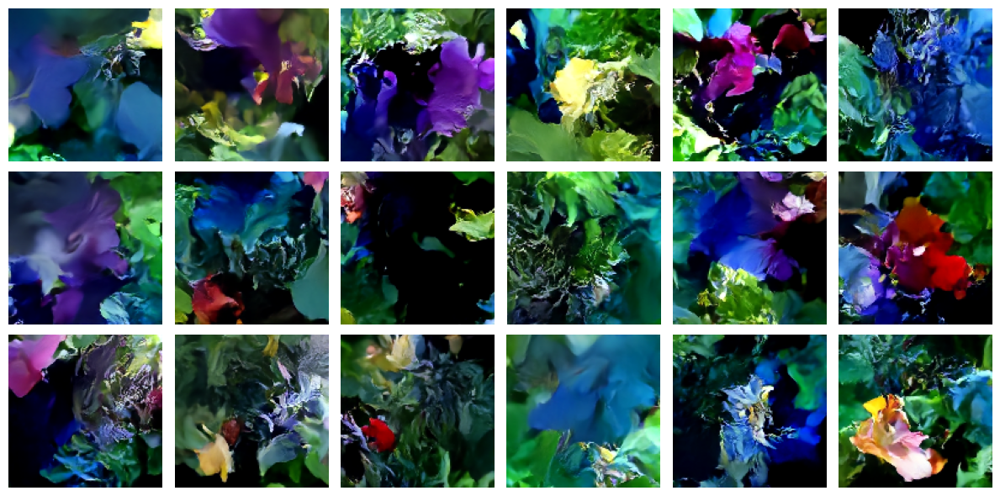

230/230 ━━━━━━━━━━━━━━━━━━━━ 24s 107ms/step - kid: 3.5108 - loss: 0.1317 - val_kid: 2.4066 - val_loss: 0.1349
Epoch 92/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - kid: 0.6194 - loss: 0.1308 - val_kid: 0.4587 - val_loss: 0.1292
Epoch 93/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 0.7542 - loss: 0.1303 - val_kid: 1.1142 - val_loss: 0.1300
Epoch 94/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 96ms/step - kid: 2.3154 - loss: 0.1319 - val_kid: 1.5550 - val_loss: 0.1266
Epoch 95/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 1.7454 - loss: 0.1321 - val_kid: 1.9658 - val_loss: 0.1296
Epoch 96/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 22s 97ms/step - kid: 1.7220 - loss: 0.1320 - val_kid: 0.8896 - val_loss: 0.1302
Epoch 97/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 92ms/step - kid: 0.5946 - loss: 0.1326 - val_kid: 0.8231 - val_loss: 0.1338
Epoch 98/100
230/230 ━━━━━━━━━━━━━━━━━━━━ 21s 91ms/step - kid: 0.7774 - loss: 0.1304 - val_kid: 0.4450 - val_loss: 0.1337
Epoch 99/100
230/230 ━━━━━━━━━━━━━━━

In [159]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=[
        KIDCallback(),
        VisualizationCallback(),
        keras.callbacks.ModelCheckpoint(
            filepath=MODELS_DIR / DIFF_NAME,
            save_best_only=True,
            monitor="val_kid",
            mode="min",
        ),
    ],
)

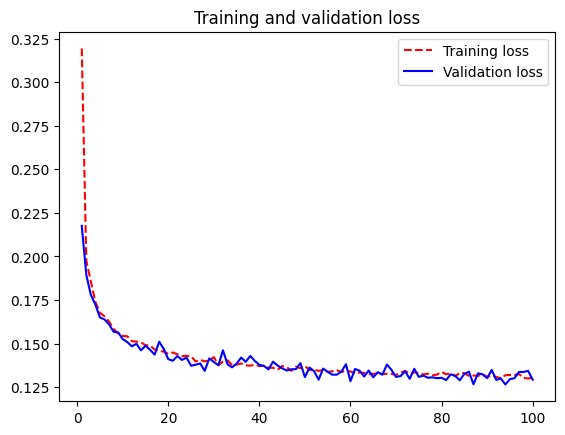

In [162]:
plot_history(history, "loss")

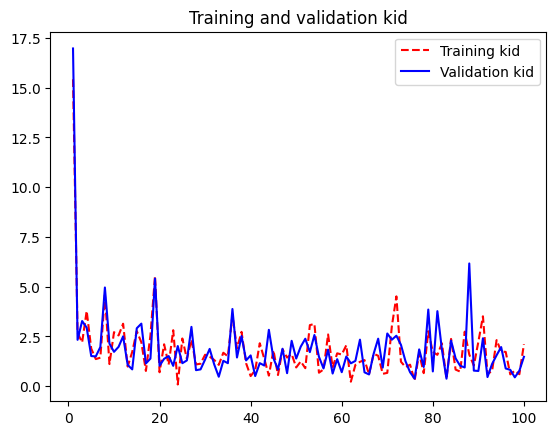

In [163]:
plot_history(history, "kid")

### Generating images with our trained model

In [164]:
model_reloaded = keras.models.load_model(MODELS_DIR / DIFF_NAME)
model_reloaded.normalizer.adapt(train_ds)

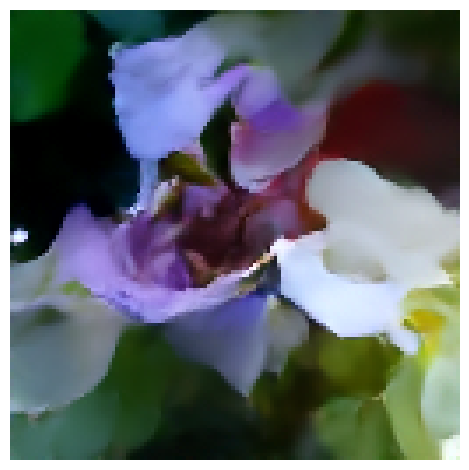

In [175]:
generated_images = keras.ops.convert_to_numpy(
    model_reloaded.generate(num_images=1, diffusion_steps=20)
)
img = generated_images[0].astype("uint8")
plt.imshow(img)
plt.axis("off")
plt.tight_layout()
plt.show()
plt.close()

## Save models to Google Drive


In [ ]:
EXPORT=False

if EXPORT:
    # zip models
    !zip diffusion-metrics.models.zip {MODELS_DIR}/*
    # connect to drive
    from google.colab import drive
    drive.mount('/content/drive')
    # copy zip to drive (adjust folder as needed)
    !cp diffusion-metrics.models.zip drive/MyDrive/gold/IS53024B-Artificial-Intelligence/models